# Hands-on Image Processing with Python
## Chapter 5: Image Enhancements using Derivatives 

### Author: Sandipan Dey

### Import libraries

In [1]:
# % matplotlib inline
import numpy as np
from scipy import signal, misc, ndimage
from skimage import filters, feature, img_as_float
from skimage.io import imread
from skimage.color import rgb2gray
from PIL import Image, ImageFilter
import matplotlib.pylab as pylab

### Derivatives and gradients

C:\Users\manka\AppData\Local\Temp\ipykernel_2396\3066547245.py:10: RuntimeWarning: divide by zero encountered in divide
  im_dir = np.arctan(im_y/im_x)
C:\Users\manka\AppData\Local\Temp\ipykernel_2396\3066547245.py:10: RuntimeWarning: invalid value encountered in divide
  im_dir = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

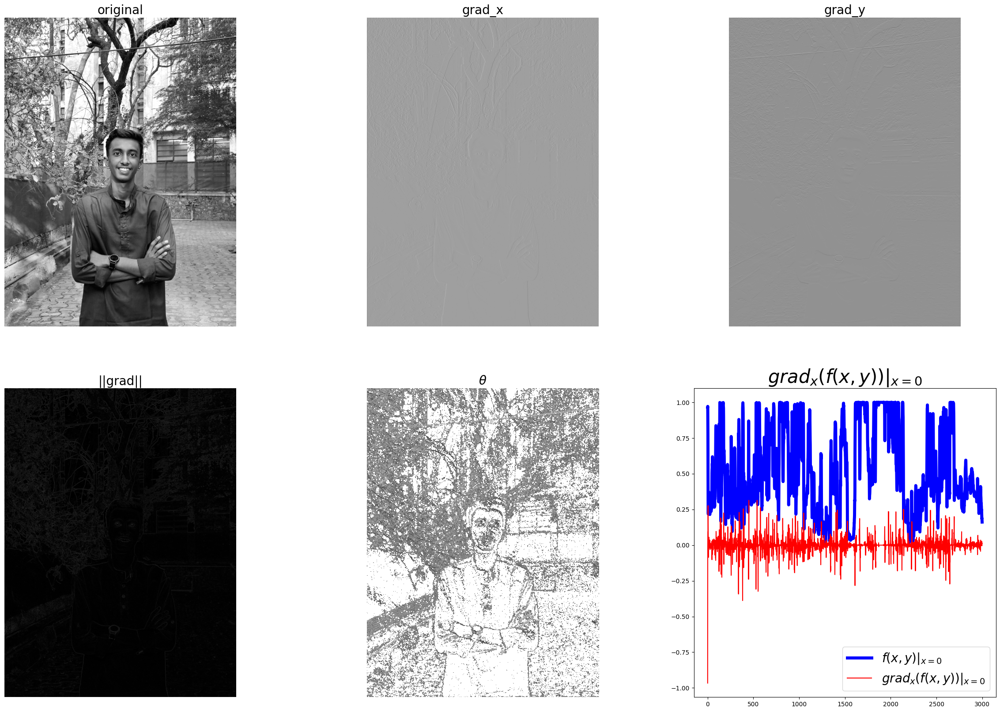

In [2]:
def plot_image(image, title):
    pylab.imshow(image), pylab.title(title, size=20), pylab.axis('off')
    
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
im_mag = np.sqrt(im_x**2 + im_y**2)
im_dir = np.arctan(im_y/im_x)
pylab.gray()
pylab.figure(figsize=(30,20))
pylab.subplot(231), plot_image(im, 'original'), pylab.subplot(232),
plot_image(im_x, 'grad_x')
pylab.subplot(233), plot_image(im_y, 'grad_y'), pylab.subplot(234),
plot_image(im_mag, '||grad||')
pylab.subplot(235), plot_image(im_dir, r'$\theta$'), pylab.subplot(236)
pylab.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
pylab.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
pylab.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
pylab.legend(prop={'size': 20})
pylab.show()

### Displaying the magnitude and the gradient on the same image

1.0


C:\Users\manka\AppData\Local\Temp\ipykernel_2396\3238251255.py:17: RuntimeWarning: divide by zero encountered in divide
  im_ang = np.arctan(im_y/im_x)
C:\Users\manka\AppData\Local\Temp\ipykernel_2396\3238251255.py:17: RuntimeWarning: invalid value encountered in divide
  im_ang = np.arctan(im_y/im_x)


<Figure size 640x480 with 0 Axes>

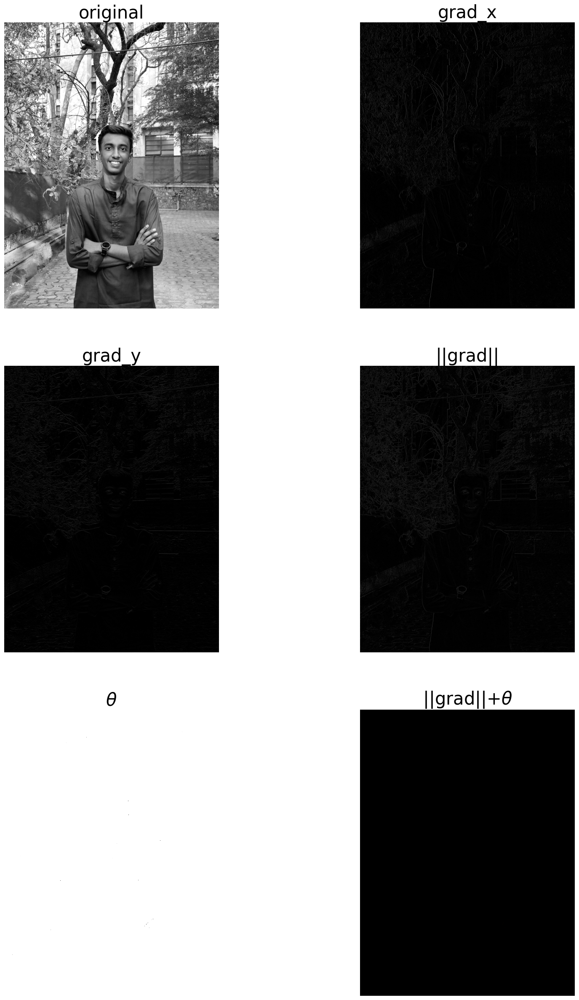

In [4]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.util import random_noise
from skimage.filters import gaussian
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
#im = random_noise(im, var=sigma**2)
#im = gaussian(im, sigma=0.25)
print(np.max(im))
im_x = np.clip(signal.convolve2d(im, ker_x, mode='same'),0,1)
im_y = np.clip(signal.convolve2d(im, ker_y, mode='same'),0,1)
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(20,30))
plt.subplot(321)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(322)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(323)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(324)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(325)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(326)
im = np.zeros((im.shape[0],im.shape[1],3))
im[...,0] = im_mag*np.sin(im_ang)
im[...,1] = im_mag*np.cos(im_ang)
plt.imshow(im)
plt.title(r'||grad||+$\theta$', size=30)
plt.axis('off')
plt.show()

### Laplacian

<Figure size 640x480 with 0 Axes>

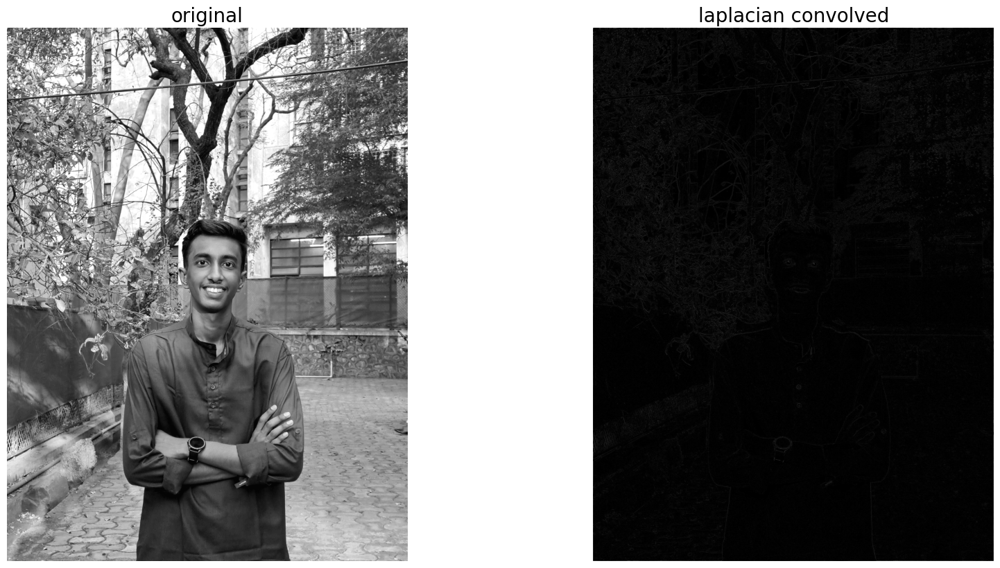

In [5]:
ker_laplacian = [[0,-1,0],[-1, 4, -1],[0,-1,0]]
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
im1 = np.clip(signal.convolve2d(im, ker_laplacian, mode='same'),0,1)
pylab.gray()
pylab.figure(figsize=(20,10))
pylab.subplot(121), plot_image(im, 'original')
pylab.subplot(122), plot_image(im1, 'laplacian convolved')
pylab.show()

### Effects of noise on gradient computation

In [7]:
# from skimage.io import imread
# from skimage.color import rgb2gray
# from skimage.util import random_noise
# from skimage.filters import gaussian
# import matplotlib.pylab as plt
# from scipy import signal
# import numpy as np
# ker_x = [[-1, 1]]
# ker_y = [[-1], [1]]
# im = rgb2gray(imread('../images/chess.png'))
# sigma = 0.25
# sign = np.random.random(im.shape)
# sign[sign <= 0.5] = -1
# sign[sign > 0.5] = 1
# im = random_noise(im, var=sigma**2)
# im = gaussian(im, sigma=0.25)
# print(np.max(im))
# im_x = signal.convolve2d(im, ker_x, mode='same')
# im_y = signal.convolve2d(im, ker_y, mode='same')
# im_mag = np.sqrt(im_x**2 + im_y**2)
# im_ang = np.arctan(im_y/im_x)
# plt.gray()
# plt.figure(figsize=(30,20))
# plt.subplot(231)
# plt.imshow(im)
# plt.title('original', size=30)
# plt.axis('off')
# plt.subplot(232)
# plt.imshow(im_x)
# plt.title('grad_x', size=30)
# plt.axis('off')
# plt.subplot(233)
# plt.imshow(im_y)
# plt.title('grad_y', size=30)
# plt.axis('off')
# plt.subplot(234)
# plt.imshow(im_mag)
# plt.title('||grad||', size=30)
# plt.axis('off')
# plt.subplot(235)
# plt.imshow(im_ang)
# plt.title(r'$\theta$', size=30)
# plt.axis('off')
# plt.subplot(236)
# plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
# plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
# plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
# plt.legend(prop={'size': 20})
# plt.show()

### Sharpening with Laplacian

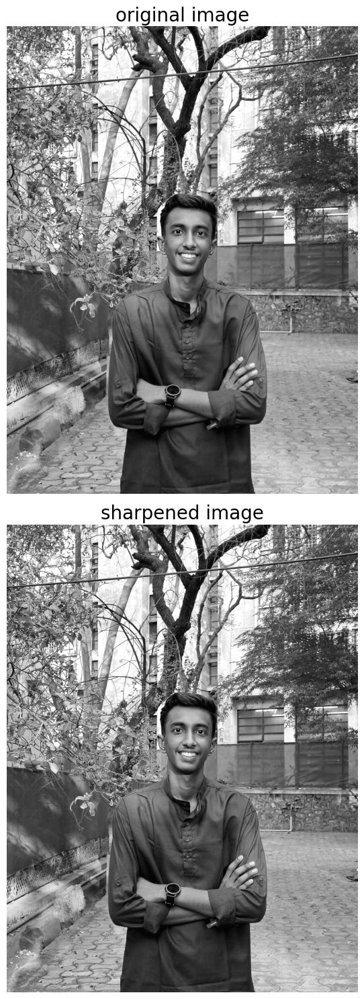

In [8]:
from skimage.filters import laplace
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
im1 = np.clip(laplace(im) + im, 0, 1)
pylab.figure(figsize=(10,15))
pylab.subplot(211), plot_image(im, 'original image')
pylab.subplot(212), plot_image(im1, 'sharpened image')
pylab.tight_layout()
pylab.show()

### Unsharp masking

<Figure size 640x480 with 0 Axes>

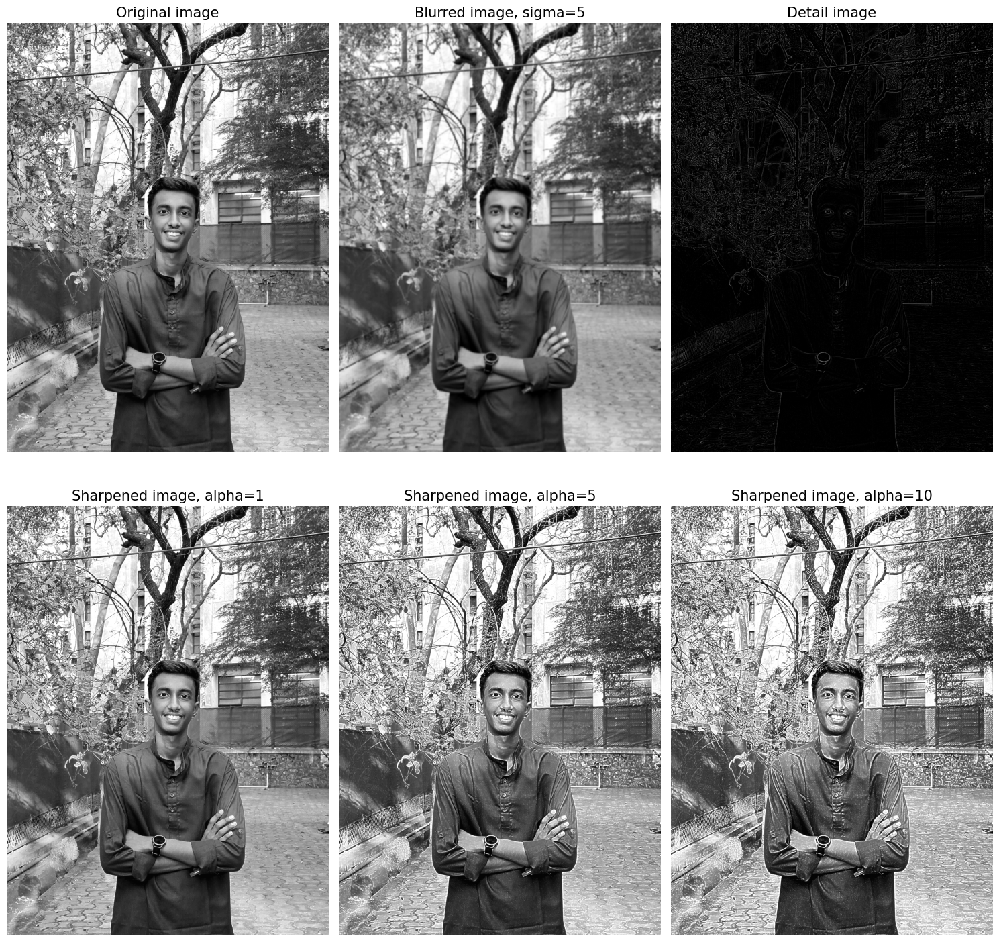

In [11]:
def rgb2gray(im):
    '''
    the input image is an RGB image
    with pixel values for each channel in [0,1]
    '''
    return np.clip(0.2989 * im[...,0] + 0.5870 * im[...,1] + 0.1140 * im[...,2], 0, 1)

im = rgb2gray(img_as_float(imread('../images/myImages/Chapter-5/myImage.png')))
im_blurred = ndimage.gaussian_filter(im, 5)
im_detail = np.clip(im - im_blurred, 0, 1)
pylab.gray()
fig, axes = pylab.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(15, 15))
axes = axes.ravel()
axes[0].set_title('Original image', size=15), axes[0].imshow(im)
axes[1].set_title('Blurred image, sigma=5', size=15),
axes[1].imshow(im_blurred)
axes[2].set_title('Detail image', size=15), axes[2].imshow(im_detail)
alpha = [1, 5, 10]
for i in range(3):
    im_sharp = np.clip(im + alpha[i]*im_detail, 0, 1)
    axes[3+i].imshow(im_sharp), axes[3+i].set_title('Sharpened image, alpha=' + str(alpha[i]), size=15)
for ax in axes:
    ax.axis('off')
fig.tight_layout()
pylab.show()

### Sobel edge detector with scikit-image

<Figure size 640x480 with 0 Axes>

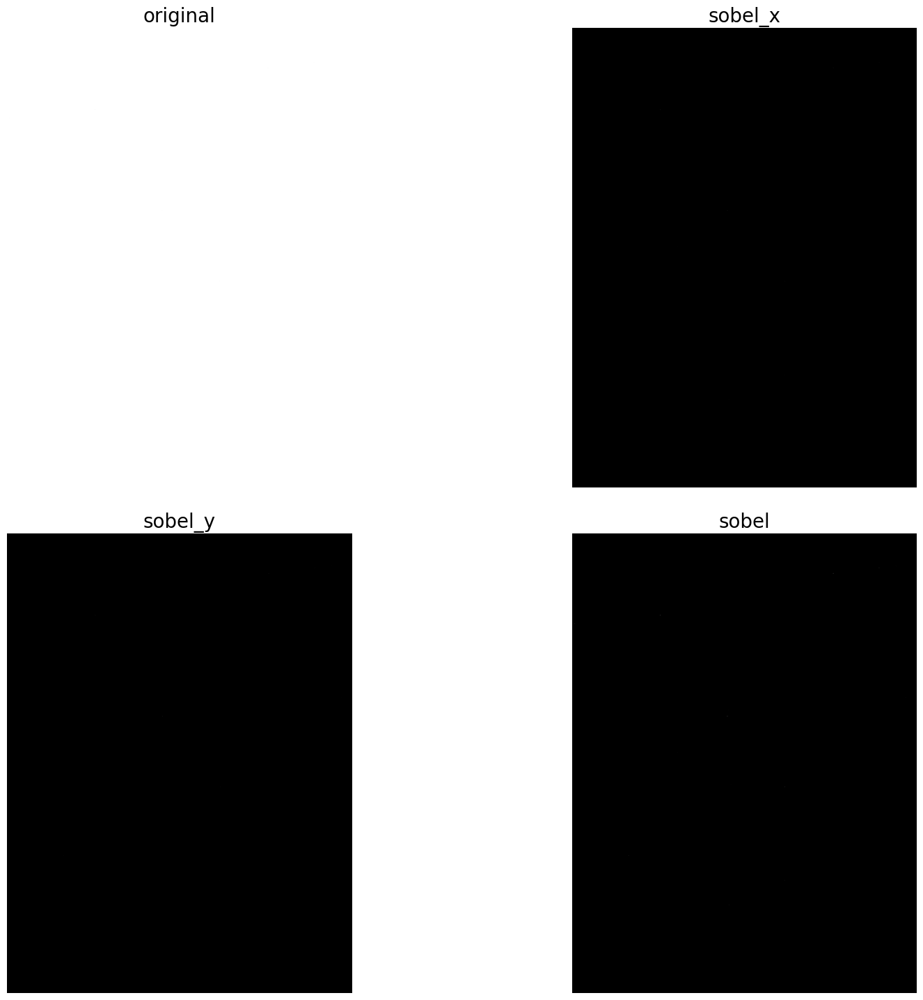

In [13]:
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png')) # RGB image to gray scale
pylab.gray()
pylab.figure(figsize=(20,18))
pylab.subplot(2,2,1)
plot_image(im, 'original')
pylab.subplot(2,2,2)
edges_x = filters.sobel_h(im)
plot_image(np.clip(edges_x,0,1), 'sobel_x')
pylab.subplot(2,2,3)
edges_y = filters.sobel_v(im)
plot_image(np.clip(edges_y,0,1), 'sobel_y')
pylab.subplot(2,2,4)
edges = filters.sobel(im)
plot_image(np.clip(edges,0,1), 'sobel')
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

### Different edge detectors with scikit-image – Prewitt, Roberts, Sobel, Scharr, and Laplace

<Figure size 640x480 with 0 Axes>

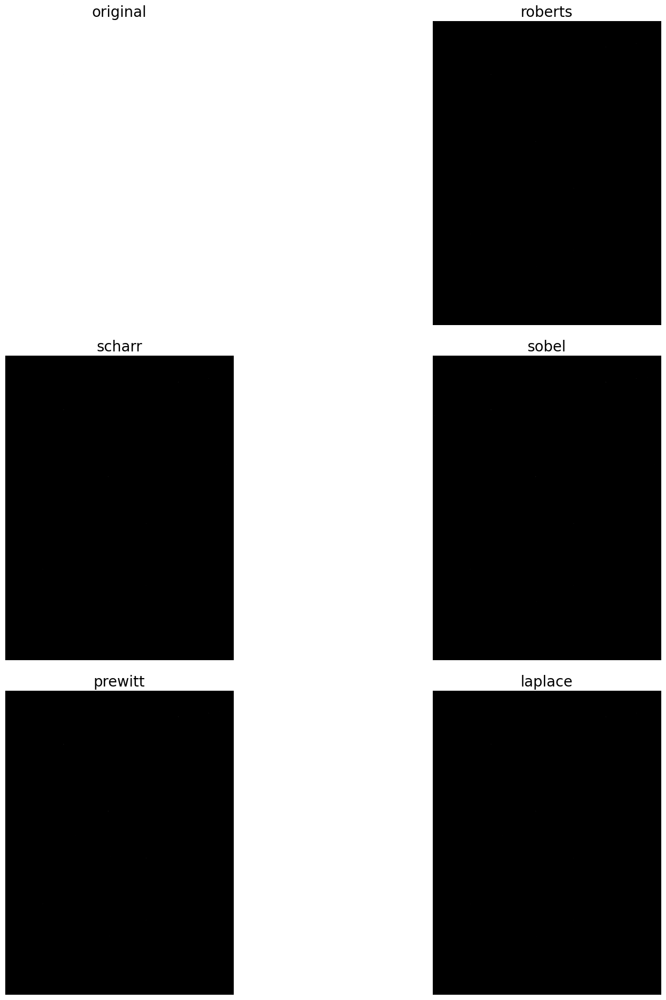

In [14]:
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png')) # RGB image to gray scale
pylab.gray()
pylab.figure(figsize=(20,24))
pylab.subplot(3,2,1), plot_image(im, 'original')
edges = filters.roberts(im)
pylab.subplot(3,2,2), plot_image(edges, 'roberts')
edges = filters.scharr(im)
pylab.subplot(3,2,3), plot_image(edges, 'scharr')
edges = filters.sobel(im)
pylab.subplot(3,2,4), plot_image(edges, 'sobel')
edges = filters.prewitt(im)
pylab.subplot(3,2,5), plot_image(edges, 'prewitt')
edges = np.clip(filters.laplace(im), 0, 1)
pylab.subplot(3,2,6), plot_image(edges, 'laplace')
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

### The Canny edge detector with scikit-image

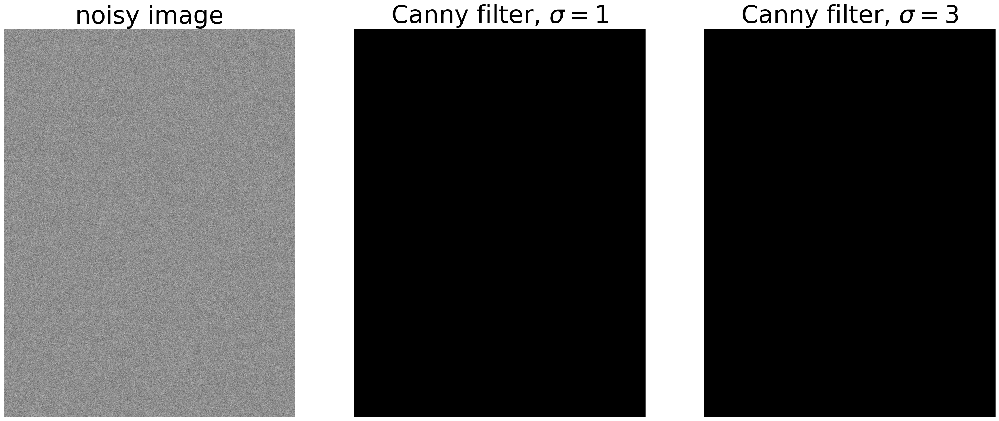

In [15]:
im = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
im = ndimage.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=2)
fig, (axes1, axes2, axes3) = pylab.subplots(nrows=1, ncols=3, figsize=(30,
12), sharex=True, sharey=True)
axes1.imshow(im, cmap=pylab.cm.gray), axes1.axis('off'),
axes1.set_title('noisy image', fontsize=50)
axes2.imshow(edges1, cmap=pylab.cm.gray), axes2.axis('off')
axes2.set_title('Canny filter, $\sigma=1$', fontsize=50)
axes3.imshow(edges2, cmap=pylab.cm.gray), axes3.axis('off')
axes3.set_title('Canny filter, $\sigma=3$', fontsize=50)
fig.tight_layout()
pylab.show()

### The LoG and DoG filters

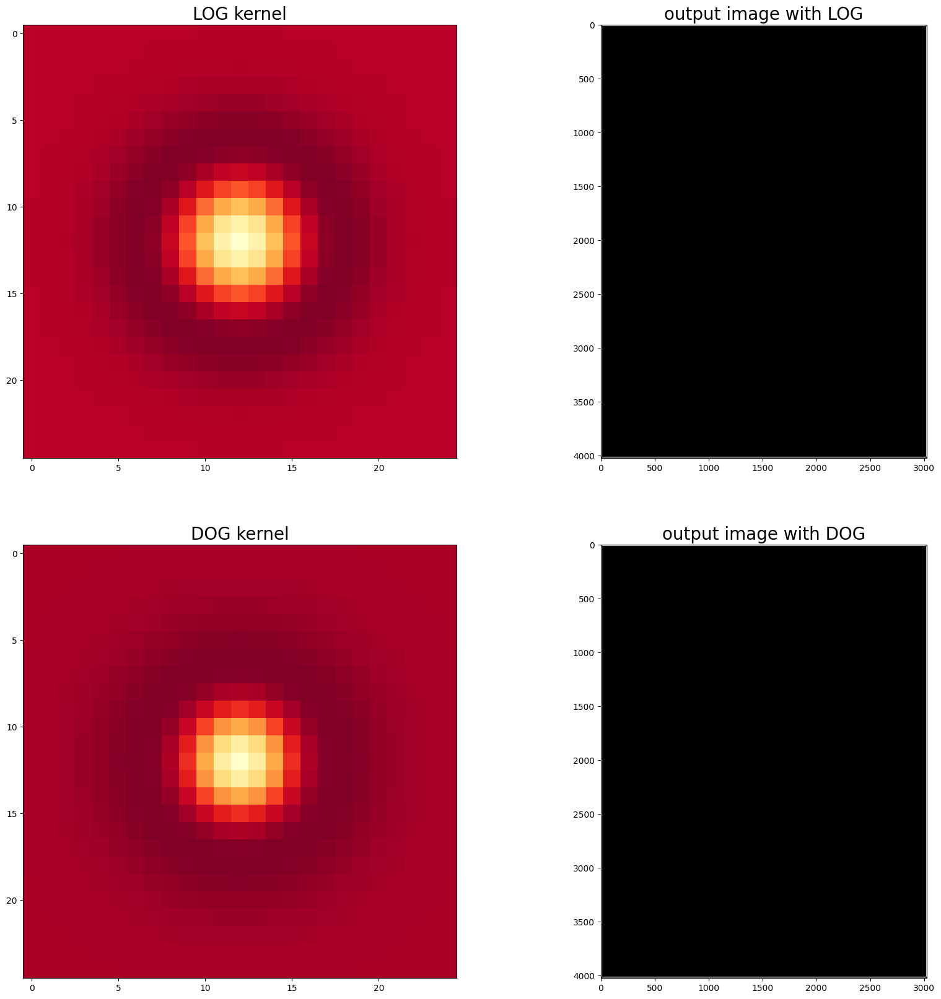

In [18]:
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from numpy import pi

def plot_kernel(kernel, s, name):
    pylab.imshow(kernel, cmap='YlOrRd')

def LOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = -(1-((i-k)**2+(j-k)**2)/(2.*s**2))*np.exp(-((i-k)**2+(j-k)**2)/(2.*s**2))/(pi*s**4)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

def DOG(k=12, s=3):
    n = 2*k+1 # size of the kernel
    s1, s2 = s * np.sqrt(2), s / np.sqrt(2)
    kernel = np.zeros((n,n))
    for i in range(n):
        for j in range(n):
            kernel[i,j] = np.exp(-((i-k)**2+(j-k)**2)/(2.*s1**2))/(2*pi*s1**2) - np.exp(-((i-k)**2+(j-k)**2)/(2.*s2**2))/(2*pi*s2**2)
    kernel = np.round(kernel / np.sqrt((kernel**2).sum()),3)
    return kernel

s = 3 # sigma value for LoG
img = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
kernel = LOG()
outimg = convolve2d(img, kernel)
pylab.figure(figsize=(20,20))
pylab.subplot(221), pylab.title('LOG kernel', size=20), plot_kernel(kernel, s, 'DOG')
pylab.subplot(222), pylab.title('output image with LOG', size=20)
pylab.imshow(np.clip(outimg,0,1), cmap='gray') # clip the pixel values in between 0 and 1
kernel = DOG()
outimg = convolve2d(img, DOG())
pylab.subplot(223), pylab.title('DOG kernel', size=20), plot_kernel(kernel, s, 'DOG')
pylab.subplot(224), pylab.title('output image with DOG', size=20)
pylab.imshow(np.clip(outimg,0,1), cmap='gray')
pylab.show()    

### The LoG filter with the SciPy ndimage module

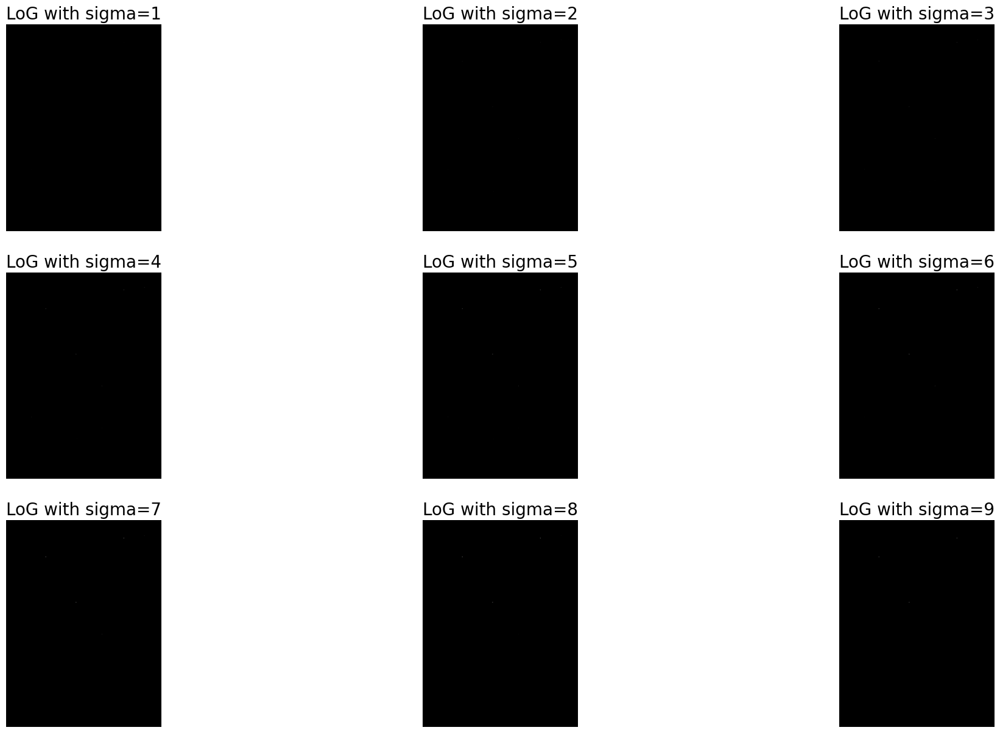

In [19]:
img = rgb2gray(imread('../images/myImages/Chapter-5/myImage.png'))
fig = pylab.figure(figsize=(25,15))
pylab.gray() # show the filtered result in grayscale
for sigma in range(1,10):
    pylab.subplot(3,3,sigma)
    img_log = ndimage.gaussian_laplace(img, sigma=sigma)
    pylab.imshow(np.clip(img_log,0,1)), pylab.axis('off')
    pylab.title('LoG with sigma=' + str(sigma), size=20)
pylab.show()

### Edge detection with the LoG filter

In [21]:
# def zero_crossing(img):
#     '''implement the function here'''
#     return None

# fig = pylab.figure(figsize=(25,15))
# pylab.gray() # show the filtered result in grayscale
# for sigma in range(2,10, 2):
#     pylab.subplot(2,2,sigma/2)
#     result = ndimage.gaussian_laplace(img, sigma=sigma)
#     pylab.imshow(zero_crossing(result)) # implement the function zero_crossing() using the above algorithm
#     pylab.axis('off')
#     pylab.title('LoG with zero-crossing, sigma=' + str(sigma), size=20)
# pylab.show()

### Finding and enhancing edges with PIL

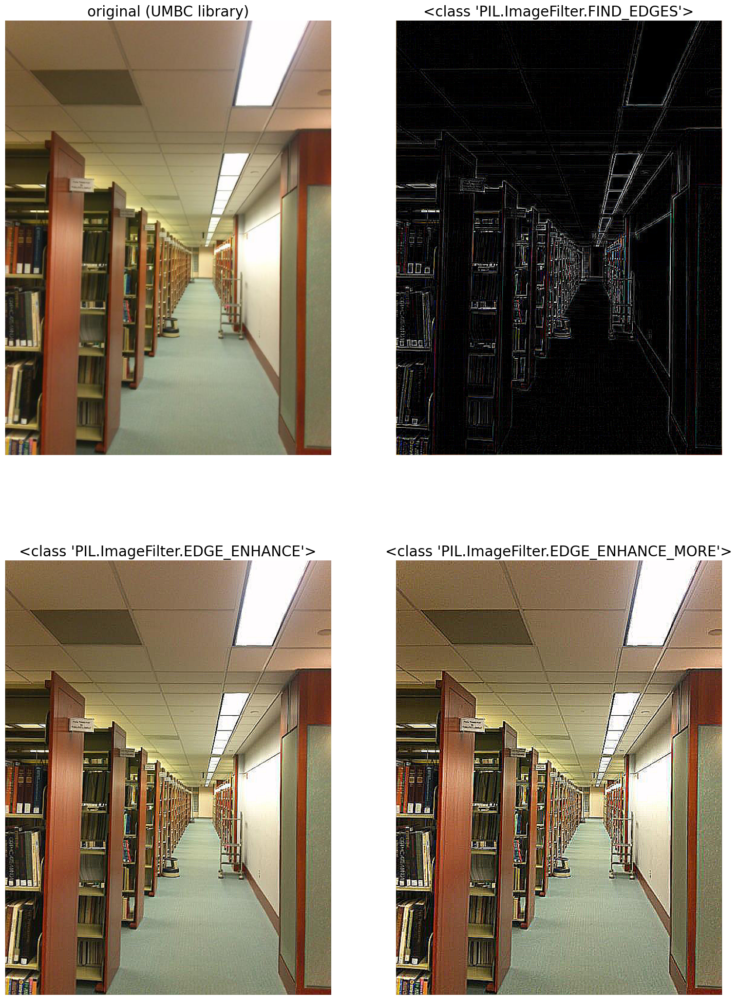

In [22]:
from PIL.ImageFilter import (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE)
im = Image.open('../images/umbc_lib.jpg')
pylab.figure(figsize=(18,25))
pylab.subplot(2,2,1)
plot_image(im, 'original (UMBC library)')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    pylab.subplot(2,2,i)
    im1 = im.filter(f)
    plot_image(im1, str(f))
    i += 1
pylab.show()

### Constructing the Gaussian Pyramid with scikitimage transform module's reduce function, and the Laplacian Pyramid from the Gaussian Pyramid and the expand function

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


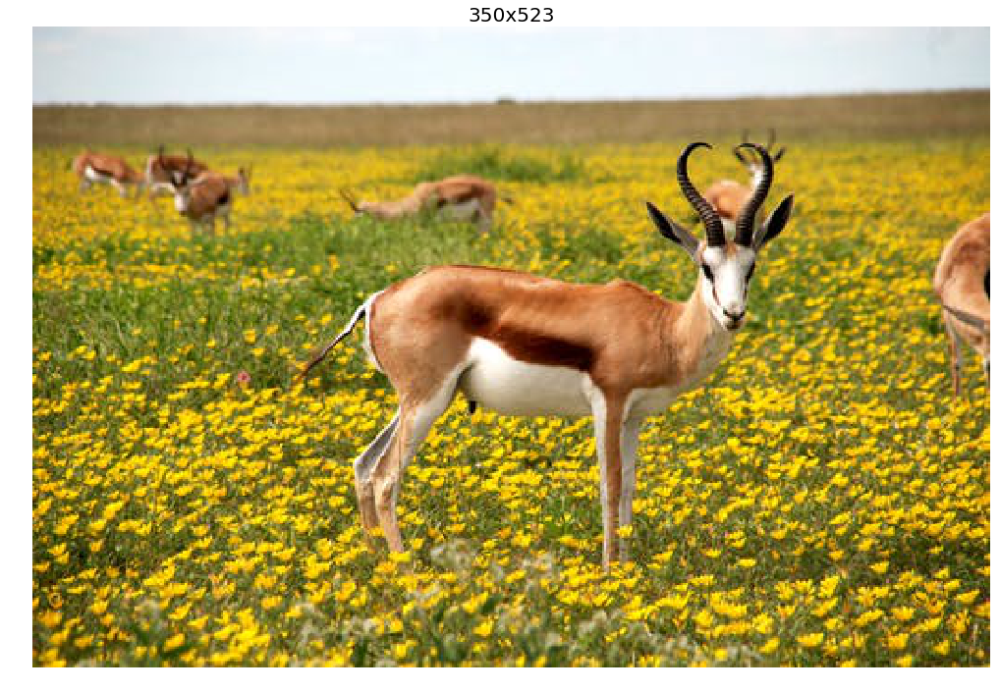

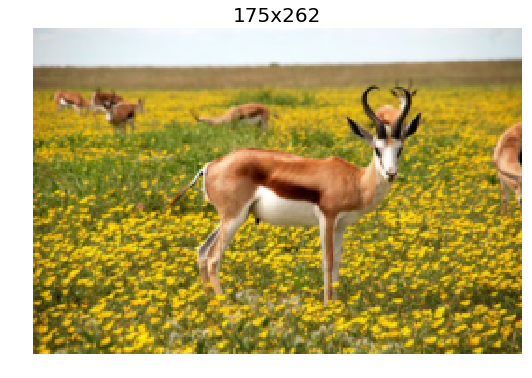

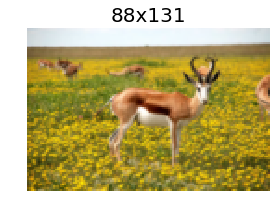

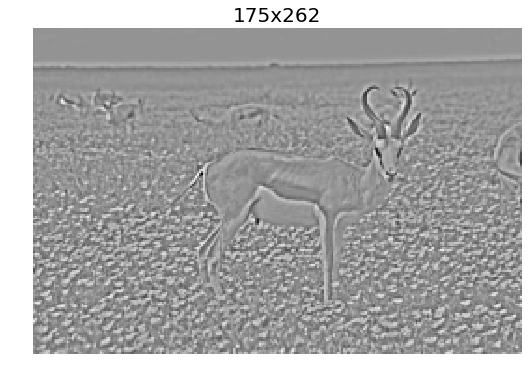

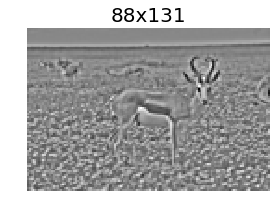

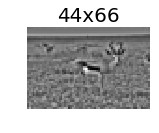

In [58]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import pyramid_reduce, pyramid_laplacian, pyramid_expand, resize

image = imread('../images/myImages/Chapter-5/myImage.png')

def get_gaussian_pyramid(image):
    rows, cols, dim = image.shape
    gaussian_pyramid = [image]
    while rows > 1 and cols > 1:
        #print(rows, cols)
        image = pyramid_reduce(image, downscale=2)
        gaussian_pyramid.append(image)
        #print(image.shape)
        rows //= 2
        cols //= 2
    return gaussian_pyramid

def get_laplacian_pyramid(gaussian_pyramid):
    laplacian_pyramid = [gaussian_pyramid[len(gaussian_pyramid)-1]]
    for i in range(len(gaussian_pyramid)-2, -1, -1):
        image = gaussian_pyramid[i] - resize(pyramid_expand(gaussian_pyramid[i+1]), gaussian_pyramid[i].shape)
        #print(i, image.shape)
        laplacian_pyramid.append(np.copy(image))
    laplacian_pyramid = laplacian_pyramid[::-1]
    return laplacian_pyramid


gaussian_pyramid = get_gaussian_pyramid(image)
laplacian_pyramid = get_laplacian_pyramid(gaussian_pyramid)
    
w, h = 20, 12
for i in range(3):
    plt.figure(figsize=(w,h))
    p = gaussian_pyramid[i]
    plt.imshow(p)
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()
    
w, h = 10, 6
for i in range(1,4):
    plt.figure(figsize=(w,h))
    p = laplacian_pyramid[i]
    plt.imshow(rgb2gray(p), cmap='gray')
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()

### Reconstructing an image only from its Laplacian pyramid

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


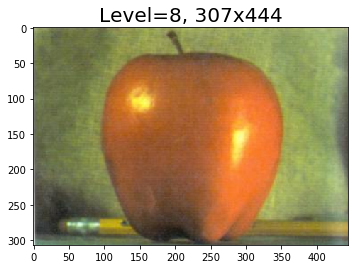

In [68]:
def reconstruct_image_from_laplacian_pyramid(pyramid):
    i = len(pyramid) - 2
    prev = pyramid[i+1]
    #plt.figure(figsize=(20,20))
    j = 1
    while i >= 0:
        prev = resize(pyramid_expand(prev, upscale=2), pyramid[i].shape)
        im = np.clip(pyramid[i] + prev,0,1)
        #plt.subplot(3,3,j)
        plt.imshow(im)
        plt.title('Level=' + str(j) + ', ' + str(im.shape[0]) + 'x' + str(im.shape[1]), size=20)
        prev = im
        i -= 1
        j += 1
    return im

image = imread('../images/apple.png')[...,:3] / 255
pyramid = get_laplacian_pyramid(get_gaussian_pyramid(image))
im = reconstruct_image_from_laplacian_pyramid(pyramid)

### Blending images with pyramids

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:24: UserWarning: The default multichannel argument (None) is deprecated.  Please specify either True or False explicitly.  multichannel will default to False starting with release 0.16.
  warn('The default multichannel argument (None) is deprecated.  Please '
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


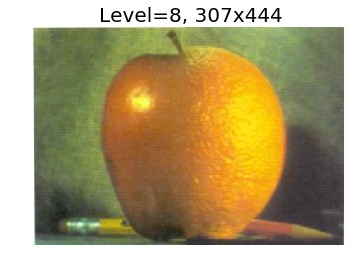

In [69]:
% matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

A = imread('../images/apple.png')[...,:3] / 255
B = imread('../images/orange.png')[...,:3] / 255
M = imread('../images/mask.png')[...,:3] / 255

rows, cols, dim = A.shape
pyramidA = get_laplacian_pyramid(get_gaussian_pyramid(A))
pyramidB = get_laplacian_pyramid(get_gaussian_pyramid(B))
pyramidM = get_gaussian_pyramid(M)

pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

im = reconstruct_image_from_laplacian_pyramid(pyramidC)

plt.imshow(im)
plt.axis('off')
plt.show()